__Intrinsic Growth and External Field Variation__  
Current model shows the opinion dynamics is easily affected by the external field sentiment.
At T=Jq/kB (Crtical Temperature), system tends to maintain its stability at M=0. However, it does not has a tendency to pull the value of M towards 0, -1, or 1. Unlike T<Tc which pull its steady state at either 1 or -1, and T>Tc which pulls M steady to 0.
This absence of force increase the system's sensitivity towards external field sentiment.
Hence, the dynamics of the collective opinions seems follows the dynamics of the external field sentiment over time steps.
To increase the model performance, in the next step, we will introduce "individual resistance" which represents how easy an individual to flip its opinion even though the system has allowed its flip attempt.

In [21]:
#SIMULATION
import numpy as np
import matplotlib.pyplot as plt

def simulate_glauber_with_data(N_up_initial, N_down_initial, N_o, T, h, J, q, r_growth, steps, external_events, dt=1.0):
    kB = 1
    # INITIAL POPULATION
    spins = ([1] * N_up_initial + [-1] * N_down_initial + [0] * N_o)
    np.random.shuffle(spins)
    N_up = N_up_initial
    N_down = N_down_initial
    N_neutral = N_o

    # DATA STORAGE
    Data_N_up = []
    Data_N_down = []
    Data_N_neutral = []
    Data_M = []
    Data_N_total = []
    Data_h_ext = []
    Data_h_eff = []
    spin_history = []

    # INITIAL DATA
    N = len(spins)
    M = (N_up - N_down) / N

    Data_N_up.append(N_up)
    Data_N_down.append(N_down)
    Data_N_neutral.append(N_neutral)
    Data_M.append(M)
    Data_N_total.append(N)
    Data_h_ext.append(h)
    Data_h_eff.append(h + J * q * M)
    spin_history.append(spins.copy())

    # MAIN SIMULATION
    for step in range(1, steps + 1):
        
        # 1. CALCULATE TOTAL EXTERNAL FIELD
        h_ext = 0.0
        decay_rate = 0.1
        
        for event_time, event_amplitude in external_events:
            if step >= event_time:
                age = step - event_time
                decay = event_amplitude * np.exp(-decay_rate * age)
                h_ext += decay
        # 2. INTRINSIC GROWTH
        N = len(spins)
        M = (N_up - N_down) / N

        # dN/dt = r*N*|M|
        dNdt = r_growth * N * M
        dN = dNdt * dt
        # Positive M -> new positive population
        if dN > 0:
            new_population = int(np.floor(dN))
            if new_population > 0:
                spins.extend([1] * new_population)
                N_up += new_population
        # Negative M -> new negative population
        elif dN < 0:
            new_population = int(np.floor(abs(dN)))
            if new_population > 0:
                spins.extend([-1] * new_population)
                N_down += new_population

        # Update total N and M
        N = len(spins)
        M = (N_up - N_down) / N

        # 3. GLAUBER DYNAMICS
        # N random spin-update attempts = 1 MCS
        for _ in range(N):
            # Continuously updated magnetization
            M = (N_up - N_down) / N

            # Effective field
            h_eff = h_ext + J * q * M

            # Randomly select a spin
            i = np.random.randint(0, N)

            sigma_old = spins[i]

            # CASE 1: POSITIVE SPIN, +1 -> -1 or stays +1
            if sigma_old == 1:
                sigma_new = -1
                delta_E = 2 * sigma_old * h_eff
                P_transition = 1 / (1 + np.exp(np.clip(delta_E / (kB * T), -100, 100)))

                random_number = np.random.rand()
                if random_number < P_transition:
                    spins[i] = sigma_new
                    N_up -= 1
                    N_down += 1

            # CASE 2: NEGATIVE SPIN, -1 -> +1 or stays -1
            elif sigma_old == -1:
                sigma_new = 1
                delta_E = 2 * sigma_old * h_eff
                P_transition = 1 / (1 + np.exp(np.clip(delta_E / (kB * T), -100, 100)))

                random_number = np.random.rand()
                if random_number < P_transition:
                    spins[i] = sigma_new
                    N_down -= 1
                    N_up += 1

            # CASE 3: NEUTRAL SPIN, 0 -> 0, +1, or -1
            elif sigma_old == 0:
                # Random order of possible candidates
                candidates = [0, 1, -1]
                np.random.shuffle(candidates)
                transition_accepted = False
                for sigma_new in candidates:

                    # If candidate is already 0,
                    # there is no actual transition
                    if sigma_new == sigma_old:
                        # 0 remains 0
                        transition_accepted = True
                        break
                    # Energy change
                    delta_E = (-(sigma_new - sigma_old) * h_eff)
                    P_transition = 1 / (1 + np.exp(np.clip(delta_E / (kB * T), -100, 100)))

                    random_number = np.random.rand()
                    if random_number < P_transition:
                        # Accept immediately
                        spins[i] = sigma_new
                        N_neutral -= 1

                        if sigma_new == 1:
                            N_up += 1

                        elif sigma_new == -1:
                            N_down += 1

                        transition_accepted = True
                        break

                # If none accepted, remains neutral

        # 4. FINAL M AFTER THIS TIMESTEP
        M = (N_up - N_down) / N

        # Effective field using final M
        h_eff = h_ext + J * q * M

        # 5. STORE DATA
        Data_N_up.append(N_up)
        Data_N_down.append(N_down)
        Data_N_neutral.append(N_neutral)
        Data_M.append(M)
        Data_N_total.append(N)
        Data_h_ext.append(h_ext)
        Data_h_eff.append(h_eff)
        spin_history.append(spins.copy())
        # PROGRESS
        if step % 10 == 0:
            print(f"MCS {step}/{steps} selesai | N = {N}")

    return (Data_N_up, Data_N_down, Data_N_neutral, Data_M, Data_N_total,
        Data_h_ext, Data_h_eff, external_events, spin_history)

In [22]:
#PARAMETER INPUT
N_up_initial = 3130
N_down_initial = 1319
N_o = 602

External_field = 0
J_coupling = 0.3
q_neighbors = 4.0

r_growth = 0.001
Temperature = 1.2
Time_steps = 200

np.random.seed(42)

#GENERATE EXTERNAL EVENTS
external_events = []
last_event_time = 0
min_event_gap = 3
event_probability = 0.10

for step in range(1, Time_steps + 1):
    if step - last_event_time >= min_event_gap:
        if np.random.rand() < event_probability:
            event_amplitude = np.random.choice((-0.21, 0.21))
            external_events.append([step, event_amplitude])
            last_event_time = step
# SAVE EVENT SCHEDULE
np.save("external_events.npy", np.array(external_events))
print("External events:", external_events)
print("External events saved.")

#RUN SIMULATION
results = simulate_glauber_with_data(N_up_initial, N_down_initial, N_o, Temperature, External_field, J_coupling,
    q_neighbors, r_growth, Time_steps, external_events, dt=1.0)

(N_up_history, N_down_history, N_neutral_history, M_history, N_total_history,
    h_ext_history, h_eff_history, external_events, spin_history) = results

External events: [[9, 0.21], [15, 0.21], [35, -0.21], [40, -0.21], [46, 0.21], [60, 0.21], [68, -0.21], [82, -0.21], [87, -0.21], [99, -0.21], [116, -0.21], [145, -0.21], [149, 0.21], [161, 0.21], [169, -0.21], [174, 0.21], [191, -0.21]]
External events saved.
MCS 10/200 selesai | N = 5060
MCS 20/200 selesai | N = 5085
MCS 30/200 selesai | N = 5115
MCS 40/200 selesai | N = 5128
MCS 50/200 selesai | N = 5150
MCS 60/200 selesai | N = 5162
MCS 70/200 selesai | N = 5175
MCS 80/200 selesai | N = 5177
MCS 90/200 selesai | N = 5197
MCS 100/200 selesai | N = 5227
MCS 110/200 selesai | N = 5257
MCS 120/200 selesai | N = 5283
MCS 130/200 selesai | N = 5312
MCS 140/200 selesai | N = 5332
MCS 150/200 selesai | N = 5350
MCS 160/200 selesai | N = 5356
MCS 170/200 selesai | N = 5375
MCS 180/200 selesai | N = 5389
MCS 190/200 selesai | N = 5409
MCS 200/200 selesai | N = 5417


In [23]:
#SHOW THE DETAILS OF EXTERNAL FIELD APPEARANCES
print("External field events:")

for event_time, event_amplitude in external_events:
    print(
        f"t = {event_time}: "
        f"h = {event_amplitude:+.1f}"
    )

External field events:
t = 9: h = +0.2
t = 15: h = +0.2
t = 35: h = -0.2
t = 40: h = -0.2
t = 46: h = +0.2
t = 60: h = +0.2
t = 68: h = -0.2
t = 82: h = -0.2
t = 87: h = -0.2
t = 99: h = -0.2
t = 116: h = -0.2
t = 145: h = -0.2
t = 149: h = +0.2
t = 161: h = +0.2
t = 169: h = -0.2
t = 174: h = +0.2
t = 191: h = -0.2


__GRAPHS SECTION__

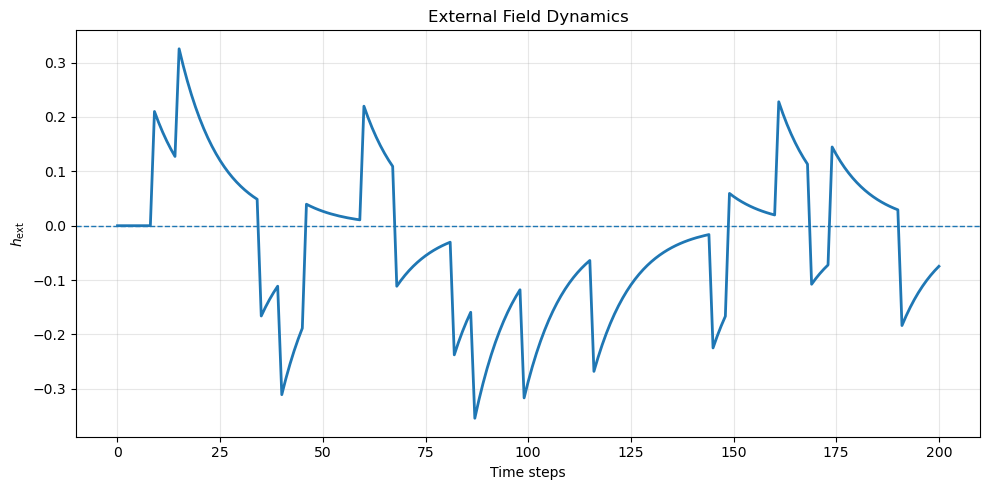

In [46]:
#PLOT EXTERNAL FIELD

time = np.arange(len(h_ext_history))

plt.figure(figsize=(10, 5))

plt.plot(
    time,
    h_ext_history,
    linewidth=2
)

plt.axhline(
    0,
    linestyle='--',
    linewidth=1
)

plt.xlabel("Time steps")
plt.ylabel(r"$h_{\mathrm{ext}}$")
plt.title("External Field Dynamics")

plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

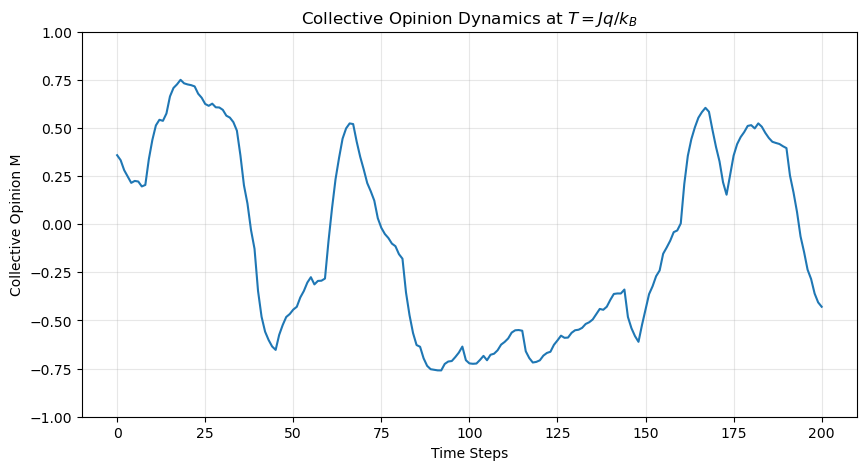

In [47]:
plt.figure(figsize=(10,5))
plt.plot(M_history)
plt.xlabel("Time Steps")
plt.ylabel("Collective Opinion M")
plt.title(r"Collective Opinion Dynamics at $T=Jq/k_B$")
plt.ylim(-1, 1)
plt.grid(alpha=0.3)
plt.show()

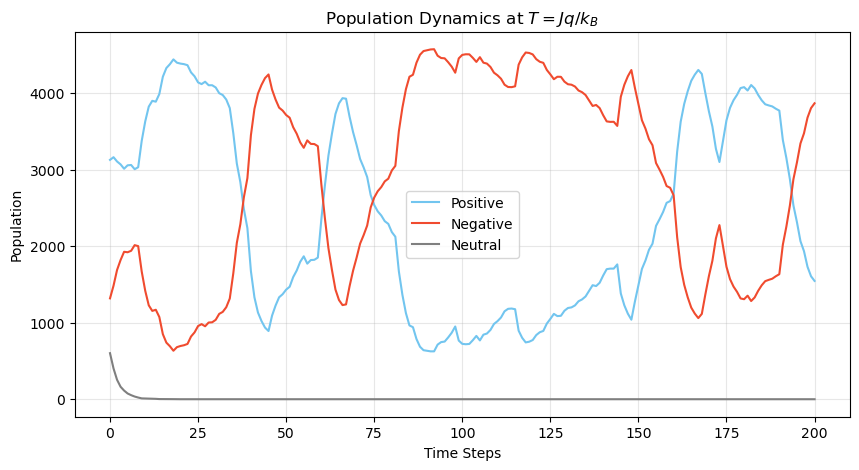

In [48]:
plt.figure(figsize=(10,5))
plt.plot(N_up_history, color="#72C5EF", label="Positive")
plt.plot(N_down_history, color="#F04B2F", label="Negative")
plt.plot(N_neutral_history, color="#7F7F7F", label="Neutral")
plt.xlabel("Time Steps")
plt.ylabel("Population")
plt.title(r"Population Dynamics at $T=Jq/k_B$")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

In [27]:
print("N_up      :", np.asarray(N_up_history).shape)
print("N_down    :", np.asarray(N_down_history).shape)
print("N_neutral :", np.asarray(N_neutral_history).shape)
print("population:", np.asarray(N_total_history).shape)

N_up      : (201,)
N_down    : (201,)
N_neutral : (201,)
population: (201,)


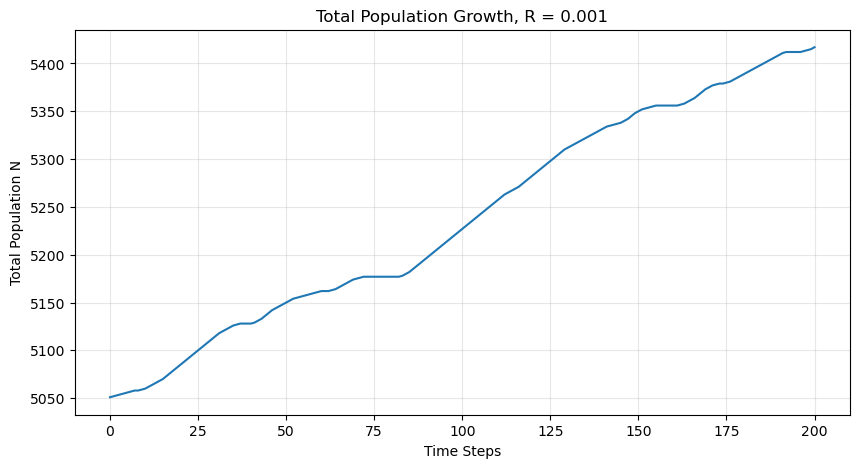

In [49]:
plt.figure(figsize=(10, 5))
plt.plot(N_total_history)
plt.xlabel("Time Steps")
plt.ylabel("Total Population N")
plt.title(f"Total Population Growth, R = {r_growth}")
plt.grid(alpha=0.3)
plt.show()

__INTERACTIVE OUTPUT SECTION (GIF, DYNAMIC LATTICE MAP, TOPOGRAPHY MAP)__

In [50]:
#GENERATE COLLECTIVE OPINION M GRAPH IN GIF 
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter

# PARAMETERS
MCS = np.arange(len(M_history))

# FIGURE
fig, ax = plt.subplots(figsize=(8, 5))

ax.set_xlim(0, len(M_history))
ax.set_ylim(-1, 1)

ax.set_xlabel("Time Steps")
ax.set_ylabel("Collective Opinion M")
ax.set_title(r"Collective Opinion Dynamics at $T=Jq/k_B$")

ax.axhline(0, linestyle="--", linewidth=1)

line, = ax.plot([], [], linewidth=2, color="#73C5EF")

# Text showing current MCS
text = ax.text(
    0.02, 0.95, "",
    transform=ax.transAxes,
    verticalalignment="top"
)

def init():
    line.set_data([], [])
    text.set_text("")
    return line, text

def update(frame):
    x = MCS[:frame + 1]
    y = np.array(M_history[:frame + 1])

    line.set_data(x, y)

    text.set_text(
        f"MCS = {frame + 1}\n"
        f"M = {y[-1]:.3f}"
    )

    return line, text

ani = FuncAnimation(
    fig,
    update,
    frames=len(M_history),
    init_func=init,
    interval=50,
    blit=True
)

ani.save(
    "collective_opinion_dynamics_GL.gif",
    writer=PillowWriter(fps=20)
)

plt.close(fig)

print("GIF saved as collective_opinion_dynamics_GL.gif")

GIF saved as collective_opinion_dynamics_GL.gif


In [51]:
#GENERATE POPULATION DYNAMICS GRAPH IN GIF
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter

# PARAMETERS
MCS = np.arange(len(N_up_history))

positive_color = "#73C5EF"
negative_color = "#F04B2F"
neutral_color  = "#7F7F7F"

# FIGURE
fig, ax = plt.subplots(figsize=(8, 5))

ax.set_xlim(0, len(N_up_history))

max_population = max(
    max(N_up_history),
    max(N_down_history),
    max(N_neutral_history)
)

ax.set_ylim(0, max_population * 1.1)

ax.set_xlabel("Time Steps")
ax.set_ylabel("Number of Individuals")

ax.set_title(
    r"Opinion Dynamics at $T=Jq/k_B$"
)

# EMPTY LINES
line_positive, = ax.plot(
    [], [],
    linewidth=2,
    color=positive_color,
    label="Positive (+1)"
)

line_negative, = ax.plot(
    [], [],
    linewidth=2,
    color=negative_color,
    label="Negative (-1)"
)

line_neutral, = ax.plot(
    [], [],
    linewidth=2,
    color=neutral_color,
    label="Neutral (0)"
)

ax.legend()

# MCS TEXT
text = ax.text(
    0.02, 0.95, "",
    transform=ax.transAxes,
    verticalalignment="top"
)

# INITIALIZATION
def init():
    line_positive.set_data([], [])
    line_negative.set_data([], [])
    line_neutral.set_data([], [])
    text.set_text("")

    return (
        line_positive,
        line_negative,
        line_neutral,
        text
    )

# ANIMATION
def update(frame):

    x = MCS[:frame + 1]

    line_positive.set_data(
        x,
        N_up_history[:frame + 1]
    )

    line_negative.set_data(
        x,
        N_down_history[:frame + 1]
    )

    line_neutral.set_data(
        x,
        N_neutral_history[:frame + 1]
    )

    text.set_text(
        f"MCS = {frame + 1}"
    )

    return (
        line_positive,
        line_negative,
        line_neutral,
        text
    )

ani = FuncAnimation(
    fig,
    update,
    frames=len(N_up_history),
    init_func=init,
    interval=50,
    blit=True
)

ani.save(
    "opinion_population_dynamics_GL.gif",
    writer=PillowWriter(fps=20)
)

plt.close(fig)

print("GIF saved as opinion_population_dynamics_GL.gif")

GIF saved as opinion_population_dynamics_GL.gif


In [52]:
#DYNAMIC MAP OF THE LATTICE 
from IPython.display import HTML, display
import json
import numpy as np

# Prepare spin data
spin_data = [np.asarray(s).tolist() for s in spin_history]

M_data = np.asarray(M_history).tolist()
N_data = np.asarray(N_total_history).tolist()

html = f"""
<div style="font-family: Arial; width: 650px;">

    <h3>Dynamic Ising Opinion Evolution Map</h3>

    <canvas id="opinionCanvas"
            width="600"
            height="600"
            style="border:1px solid black;">
    </canvas>

    <br><br>

    <input
        type="range"
        id="timeSlider"
        min="0"
        max="{len(spin_data)-1}"
        value="0"
        step="1"
        style="width:600px;"
    >

    <br><br>

    <button id="playButton">
        ▶ Play
    </button>

    <p>
        MCS:
        <span id="mcsValue">0</span>
        &nbsp;&nbsp;&nbsp;

        M:
        <span id="magValue">---</span>

        &nbsp;&nbsp;&nbsp;

        N:
        <span id="NValue">---</span>
    </p>

</div>

<script>

(function(){{

    const spinData = {json.dumps(spin_data)};
    const magnetization = {json.dumps(M_data)};
    const population = {json.dumps(N_data)};

    const canvas = document.getElementById("opinionCanvas");
    const ctx = canvas.getContext("2d");

    const slider = document.getElementById("timeSlider");
    const playButton = document.getElementById("playButton");

    const mcsText = document.getElementById("mcsValue");
    const magText = document.getElementById("magValue");
    const NText = document.getElementById("NValue");

    let playing = false;
    let animationTimer = null;

    // =========================
    // Draw map
    // =========================

    function drawMap(mcs) {{

        const spins = spinData[mcs];

        const N = spins.length;

        const gridSize = Math.ceil(Math.sqrt(N));

        ctx.clearRect(
            0,
            0,
            canvas.width,
            canvas.height
        );

        ctx.fillStyle = "white";

        ctx.fillRect(
            0,
            0,
            canvas.width,
            canvas.height
        );

        const cellSize = canvas.width / gridSize;

        for (let i = 0; i < N; i++) {{

            const row = Math.floor(i / gridSize);
            const col = i % gridSize;

            const x = col * cellSize;
            const y = row * cellSize;

            const spin = spins[i];
            if (spin === 1) {{
                ctx.fillStyle = "#73C5EF";
            }}
            else if (spin === -1) {{
                ctx.fillStyle = "#F04B2F";
            }}
            else {{
                ctx.fillStyle = "#7F7F7F";
            }}

            ctx.fillRect(
                x,
                y,
                cellSize,
                cellSize
            );
        }}

        // Display information

        mcsText.textContent = mcs;

        if (mcs < magnetization.length) {{
            magText.textContent =
                magnetization[mcs].toFixed(4);
        }}
        else {{
            magText.textContent = "---";
        }}

        if (mcs < population.length) {{
            NText.textContent = population[mcs];
        }}
        else {{
            NText.textContent = "---";
        }}
    }}

    // =========================
    // Slider
    // =========================

    slider.addEventListener(
        "input",
        function() {{
            drawMap(parseInt(this.value));
        }}
    );

    // =========================
    // Play / Pause
    // =========================

    playButton.addEventListener(
        "click",
        function() {{

            if (playing) {{

                playing = false;

                clearInterval(animationTimer);

                playButton.textContent = "▶ Play";

            }} else {{

                playing = true;

                playButton.textContent = "⏸ Pause";

                animationTimer = setInterval(
                    function() {{

                        let current =
                            parseInt(slider.value);

                        if (current >= spinData.length - 1) {{

                            playing = false;

                            clearInterval(animationTimer);

                            playButton.textContent = "▶ Play";

                            return;
                        }}

                        current += 1;

                        slider.value = current;

                        drawMap(current);

                    }},
                    50
                );
            }}
        }}
    );

    // =========================
    // Initial map
    // =========================

    drawMap(0);

}})();

</script>
"""

display(HTML(html))

In [53]:
#GENERATE LATTICE DYNAMIC MAP GIF
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from matplotlib.colors import ListedColormap, BoundaryNorm

#COLOR PALLETTE
negative_color = "#F04B2F"   # -1
neutral_color  = "#7F7F7F"   #  0
positive_color = "#73C5EF"   # +1
empty_color    = "white"     # padding

#CUSTOM COLORMAP
cmap = ListedColormap([
    negative_color,
    neutral_color,
    positive_color
])
#Color for empty cells
cmap.set_bad(color=empty_color)

norm = BoundaryNorm([-1.5, -0.5, 0.5, 1.5],cmap.N)

#FIGURE
fig, ax = plt.subplots(figsize=(6, 6))

def update(frame):
    ax.clear()

    spins = np.asarray(spin_history[frame])
    N = len(spins)

    grid_size = int(np.ceil(np.sqrt(N)))

    # Make a square grid
    padded = np.full(grid_size**2, np.nan)
    padded[:N] = spins
    grid = padded.reshape(grid_size, grid_size)

    # +1 = light blue, 0 = gray, -1 = red
    ax.imshow(
        grid,
        cmap=cmap,
        norm=norm,
        interpolation="nearest"
    )

    ax.set_title(
        f"MCS: {frame} | "
        f"M = {M_history[frame]:.3f} | "
        f"N = {N_total_history[frame]}"
    )

    ax.set_xticks([])
    ax.set_yticks([])


anim = FuncAnimation(
    fig,
    update,
    frames=len(spin_history),
    interval=50,
    repeat=False
)

# Save as GIF
anim.save(
    "dynamic_ising_map_GL.gif",
    writer=PillowWriter(fps=10)
)

plt.close(fig)

print("GIF saved as dynamic_ising_map_GL.gif")

GIF saved as dynamic_ising_map_GL.gif


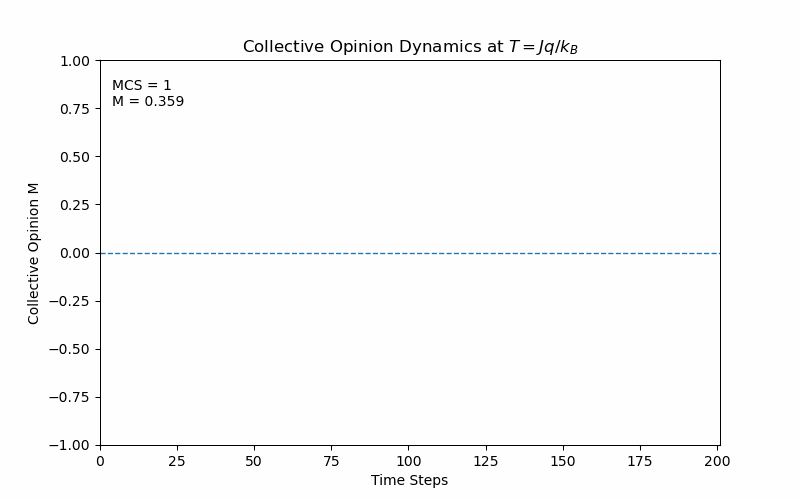

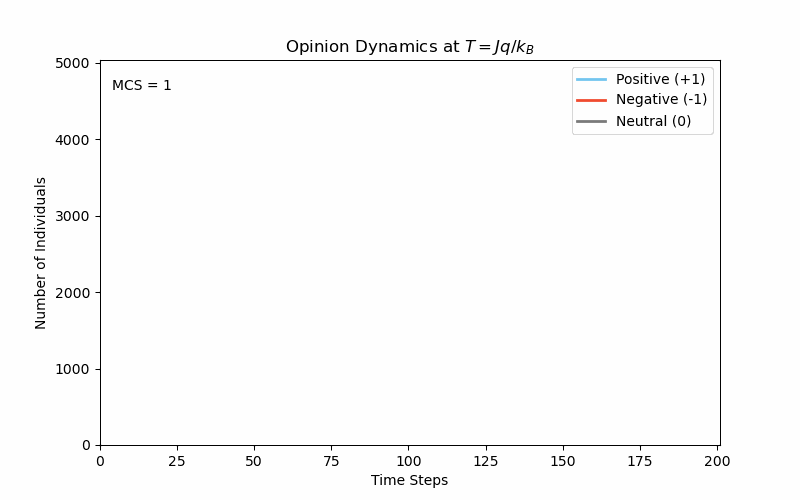

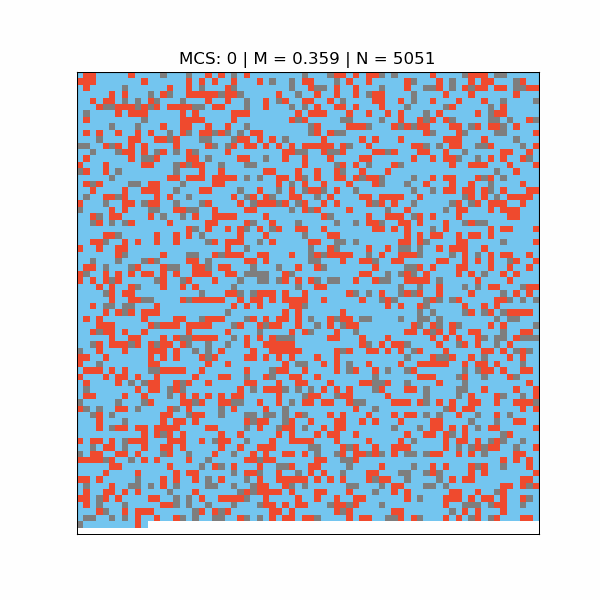

In [54]:
#DISPLAY THE GIFS
from IPython.display import Image, display
#Adjust the Path File Here
display(Image(filename=r"C:\Users\HP\collective_opinion_dynamics_GL.gif"))
display(Image(filename=r"C:\Users\HP\opinion_population_dynamics_GL.gif"))
display(Image(filename=r"C:\Users\HP\dynamic_ising_map_GL.gif"))

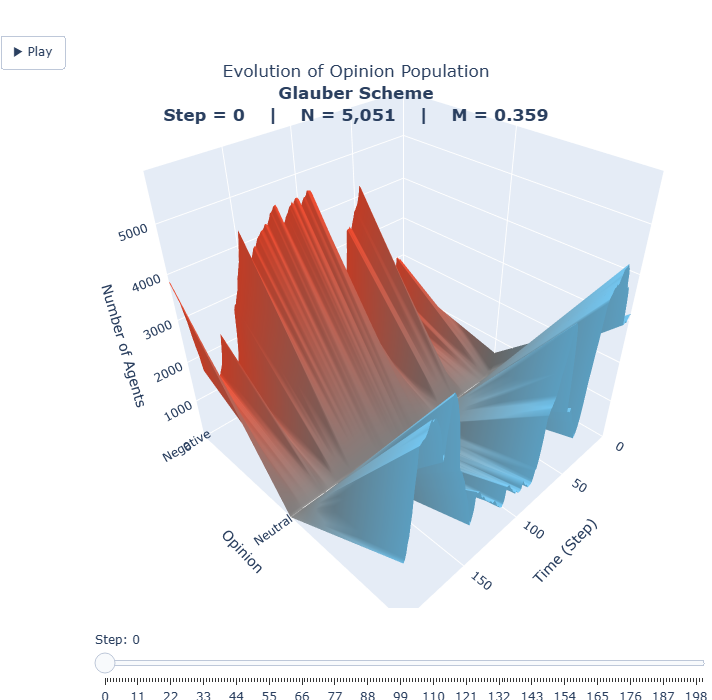

In [55]:
#3D GRAPH OF COLLECTIVE OPINION AND OPINION OVER TIME 
import numpy as np
import plotly.graph_objects as go

# DATA
mcs = np.arange(len(N_up_history))

N_up = np.asarray(N_up_history)
N_down = np.asarray(N_down_history)
N_neutral = np.asarray(N_neutral_history)

N_total = np.asarray(N_total_history)
M_data = np.asarray(M_history)

# Opinion states
# -1 = Negative
#  0 = Neutral
# +1 = Positive
opinions = np.array([-1, 0, 1])

# Population for each opinion
population = np.vstack([
    N_down,
    N_neutral,
    N_up
])

# Mesh for initial surface
X, Y = np.meshgrid(mcs, opinions)

# Opinion Color
colorscale = [
    [0.0, "#F04B2F"],   # Negative
    [0.5, "#7F7F7F"],   # Neutral
    [1.0, "#72C5EF"]    # Positive
]

# INITIAL FIGURE
fig = go.Figure(
    data=[
        go.Surface(
            x=X,
            y=Y,
            z=population,

            # Color based on opinion
            surfacecolor=Y,

            colorscale=colorscale,
            cmin=-1,
            cmax=1,

            showscale=False
        )
    ]
)

# FRAMES FOR ANIMATION
frames = []

for i in range(len(mcs)):

    # Only shows data until i-th step
    current_mcs = mcs[:i+1]

    X_frame, Y_frame = np.meshgrid(
        current_mcs,
        opinions
    )

    Z_frame = population[:, :i+1]

    frames.append(
        go.Frame(

            # Surface at current step
            data=[
                go.Surface(
                    x=X_frame,
                    y=Y_frame,
                    z=Z_frame,

                    surfacecolor=Y_frame,

                    colorscale=colorscale,
                    cmin=-1,
                    cmax=1,

                    showscale=False
                )
            ],

            # Frame name
            name=str(i),

            # INFORMATION TEXT ON TOP OF MAP
            layout=go.Layout(
                title=dict(
                    text=(
                        "Evolution of Opinion Population"
                        "<br>"
                        "<b>Glauber Scheme</b>"
                        "<br>"
                        f"<b>Step = {i} &nbsp;&nbsp; "
                        f"| &nbsp;&nbsp; N = {N_total[i]:,} "
                        f"&nbsp;&nbsp; | &nbsp;&nbsp; "
                        f"M = {M_data[i]:.3f}</b>"
                    )
                )
            )
        )
    )


fig.frames = frames

# LAYOUT
fig.update_layout(

    title=dict(
        text=(
            "Evolution of Opinion Population"
            "<br>"
            "<b>Glauber Scheme</b>"
            "<br>"
            f"<b>Step = {mcs[0]} &nbsp;&nbsp; "
            f"| &nbsp;&nbsp; N = {N_total[0]:,} "
            f"&nbsp;&nbsp; | &nbsp;&nbsp; "
            f"M = {M_data[0]:.3f}</b>"
        ),
        x=0.5,
        y=0.89
    ),

    # Adjust distance of title and graph
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=35
    ),

    # 3D SCENE
    scene=dict(

        xaxis=dict(
            title="Time (Step)",
            range=[0, mcs[-1]]
        ),

        yaxis=dict(
            title="Opinion",

            tickmode="array",
            tickvals=[-1, 0, 1],
            ticktext=[
                "Negative",
                "Neutral",
                "Positive"
            ],

            range=[-1, 1]
        ),

        zaxis=dict(
            title="Number of Agents",
            range=[
                0,
                np.max(N_total) * 1.1
            ]
        )
    ),

    # PLAY BUTTON
    updatemenus=[
        {
            "type": "buttons",
            "showactive": False,

            "buttons": [
                {
                    "label": "▶ Play",

                    "method": "animate",

                    "args": [
                        None,

                        {
                            "frame": {
                                "duration": 100,
                                "redraw": True
                            },

                            "transition": {
                                "duration": 0
                            },

                            "fromcurrent": True
                        }
                    ]
                }
            ]
        }
    ],

    # SLIDER
    sliders=[
        {
            "active": 0,

            "currentvalue": {
                "prefix": "Step: "
            },

            "steps": [

                {
                    "args": [
                        [str(i)],

                        {
                            "frame": {
                                "duration": 0,
                                "redraw": True
                            },

                            "transition": {
                                "duration": 0
                            },

                            "mode": "immediate"
                        }
                    ],

                    "label": str(i),

                    "method": "animate"
                }

                for i in range(len(mcs))
            ]
        }
    ],

    width=1000,
    height=700
)


# SHOW
fig.show()